In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

# Analysing customer dataset

In [5]:
customer = pd.read_csv("olist_customers_dataset.csv") #importing customer information
customer.head()

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP


In [6]:
customer.describe()

,customer_zip_code_prefix
count,99441.000000
mean,35137.474583
std,29797.938996
min,1003.000000
25%,11347.000000
50%,24416.000000
75%,58900.000000
max,99990.000000


## Shape of dataset

In [7]:
customer.shape

(99441, 5)

## Now analysing each feature

In [8]:
### cutomer_id
id = set(customer["customer_id"])
len(id)

99441

In [9]:
#All values are unique
## Next is the unique customer_id
u_id = set([i.lower() for i in customer["customer_unique_id"]])
len(u_id)

96096

### Over three thousand customers have repeat orders, so we can identify who are those customers who reorder

## Repeat Orders

In [10]:
rep = customer["customer_unique_id"].value_counts().to_frame().reset_index()
rep.columns=['u_id','count']
rep1 = rep[rep["count"]>1]
rep_lis = customer[customer["customer_unique_id"].isin(rep1["u_id"])].reset_index(drop=True)
rep_lis

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,879864dab9bc3047522c92c82e1212b8,4c93744516667ad3b8f1fb645a3116a4,89254,jaragua do sul,SC
1,5adf08e34b2e993982a47070956c5c65,1175e95fb47ddff9de6b2b06188f7e0d,81560,curitiba,PR
2,eabebad39a88bb6f5b52376faec28612,295c05e81917928d76245e842748184d,5704,sao paulo,SP
3,2d5831cb2dff7cdefba62e950ae3dc7b,e9dd12dca17352644a959d9dea133935,42800,camacari,BA
4,b2bed119388167a954382cca36c4777f,e079b18794454de9d2be5c12b4392294,27525,resende,RJ
...,...,...,...,...,...
6337,5b46a0d983eec8c97363bea78d4a69dd,8bab3162259edfaadd1ea2e1fe7f58dc,31565,belo horizonte,MG
6338,c1affa46f9f3b514555259049a0307b9,12ab9334b1240d6d037f2b0102a49571,38050,uberaba,MG
6339,ebf46ff530343a129926adc1f831dea4,0ee57f62666561b72f2ceacad0230cbf,9530,sao caetano do sul,SP
6340,282fbce48e4d2077aad602dd125c9225,0ceb502fc33a2ad327b08288c5310e2e,29134,viana,ES


### So we get the data that out of the 99441 orders that were placed 6342 were made by customers who had already ordered something before. The first segmentation hence that we will make is between people who made just singular orders and people who made multiple orders.

## Single Orders

In [11]:
sin = rep[rep["count"]==1]
sin_lis = customer[customer["customer_unique_id"].isin(sin["u_id"])].reset_index(drop=True)
sin_lis

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP
...,...,...,...,...,...
93094,17ddf5dd5d51696bb3d7c6291687be6f,1a29b476fee25c95fbafc67c5ac95cf8,3937,sao paulo,SP
93095,e7b71a9017aa05c9a7fd292d714858e8,d52a67c98be1cf6a5c84435bd38d095d,6764,taboao da serra,SP
93096,5e28dfe12db7fb50a4b2f691faecea5e,e9f50caf99f032f0bf3c55141f019d99,60115,fortaleza,CE
93097,56b18e2166679b8a959d72dd06da27f9,73c2643a0a458b49f58cea58833b192e,92120,canoas,RS


# Analysing Location Data

In [12]:
geo_loc = pd.read_csv("olist_geolocation_dataset.csv") #importing location information
geo_loc.head()

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
0,1037,-23.545621,-46.639292,sao paulo,SP
1,1046,-23.546081,-46.644820,sao paulo,SP
2,1046,-23.546129,-46.642951,sao paulo,SP
3,1041,-23.544392,-46.639499,sao paulo,SP
4,1035,-23.541578,-46.641607,sao paulo,SP


In [13]:
geo_loc.shape

(1000163, 5)

In [14]:
geo_loc.describe()

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng
count,1.000163e+06,1.000163e+06,1.000163e+06
mean,3.657417e+04,-2.117615e+01,-4.639054e+01
std,3.054934e+04,5.715866e+00,4.269748e+00
min,1.001000e+03,-3.660537e+01,-1.014668e+02
25%,1.107500e+04,-2.360355e+01,-4.857317e+01
50%,2.653000e+04,-2.291938e+01,-4.663788e+01
75%,6.350400e+04,-1.997962e+01,-4.376771e+01
max,9.999000e+04,4.506593e+01,1.211054e+02


### The location data does not seem to be that important except for when trying to depict the purchases on a map, which we are not trying to do right now, so we will not be including this in our analysis

In [15]:
items = pd.read_csv("olist_order_items_dataset.csv")
items.head()

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14


In [16]:
items.shape

(112650, 7)

In [17]:
items["cost"] = items["price"]+items["freight_value"]
items = items.drop(["price","freight_value"],axis=1)

### Right now we don't have any observation to link the cost data with the 1st segmentation, so we will keep this data on hold for now

# Analysing payment data

In [18]:
payments = pd.read_csv("olist_order_payments_dataset.csv")
payments.head()

,order_id,payment_sequential,payment_type,payment_installments,payment_value
0,b81ef226f3fe1789b1e8b2acac839d17,1,credit_card,8,99.33
1,a9810da82917af2d9aefd1278f1dcfa0,1,credit_card,1,24.39
2,25e8ea4e93396b6fa0d3dd708e76c1bd,1,credit_card,1,65.71
3,ba78997921bbcdc1373bb41e913ab953,1,credit_card,8,107.78
4,42fdf880ba16b47b59251dd489d4441a,1,credit_card,2,128.45


In [19]:
len(set(payments["payment_sequential"]))

29

In [20]:
set(payments["payment_type"])

{'boleto', 'credit_card', 'debit_card', 'not_defined', 'voucher'}

In [21]:
payments = payments.drop(["payment_sequential"],axis=1)

In [22]:
payments.describe()

,payment_installments,payment_value
count,103886.000000,103886.000000
mean,2.853349,154.100380
std,2.687051,217.494064
min,0.000000,0.000000
25%,1.000000,56.790000
50%,1.000000,100.000000
75%,4.000000,171.837500
max,24.000000,13664.080000


In [23]:
payments.shape

(103886, 4)

### The number of payments is more than the number of customer ids as is the trend across all the items and for our analysis we have decided to keep the number of customers as the threshold and get rid of the other excess data

### We won't be analysing the sentiment data right now as that will be used for sentiment analysis separately.

# Orders Data

In [24]:
orders = pd.read_csv("olist_orders_dataset.csv")
print(orders.shape)
orders.head()

(99441, 8)


,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15 00:00:00
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26 00:00:00


### The orders dataset has the exact number of data as the customer data and it has the customer id mentioned and the order id which can be thus used to combine our relevant datasets

## Exploring orders data

In [25]:
len(set(orders["customer_id"]))

99441

In [26]:
orders.dtypes

order_id                         object
customer_id                      object
order_status                     object
order_purchase_timestamp         object
order_approved_at                object
order_delivered_carrier_date     object
order_delivered_customer_date    object
order_estimated_delivery_date    object
dtype: object

In [27]:
a = 0
for i in orders.columns:
    if a == 0:
        if i == "order_purchase_timestamp":
            a=1
            orders[i] = pd.to_datetime(orders[i])
    else:
        orders[i] = pd.to_datetime(orders[i])

In [28]:
orders.dtypes

order_id                                 object
customer_id                              object
order_status                             object
order_purchase_timestamp         datetime64[ns]
order_approved_at                datetime64[ns]
order_delivered_carrier_date     datetime64[ns]
order_delivered_customer_date    datetime64[ns]
order_estimated_delivery_date    datetime64[ns]
dtype: object

In [29]:
set(orders["order_status"])

{'approved',
 'canceled',
 'created',
 'delivered',
 'invoiced',
 'processing',
 'shipped',
 'unavailable'}

## Delivered orders

In [30]:
delivered = orders[orders["order_status"]=="delivered"]

In [31]:
not_delivered = orders[orders["order_status"]!="delivered"]

In [32]:
orders["confirm_time"] = orders["order_approved_at"]-orders["order_purchase_timestamp"]
orders["time_taken"] = orders["order_delivered_customer_date"] - orders["order_purchase_timestamp"]
orders["deviation_from_exp"] = orders["order_estimated_delivery_date"]-orders["order_delivered_customer_date"]

In [33]:
### Checking if there has been any delay
import datetime
delay = orders[orders["deviation_from_exp"]<np.timedelta64(0,'ns')]

In [34]:
delay.shape

(7827, 11)

### Over 7000 deliveries have been delayed

# Product data

In [35]:
product = pd.read_csv("olist_products_dataset.csv")
print(product.shape)
product.head()

(32951, 9)


,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumaria,40.0,287.0,1.0,225.0,16.0,10.0,14.0
1,3aa071139cb16b67ca9e5dea641aaa2f,artes,44.0,276.0,1.0,1000.0,30.0,18.0,20.0
2,96bd76ec8810374ed1b65e291975717f,esporte_lazer,46.0,250.0,1.0,154.0,18.0,9.0,15.0
3,cef67bcfe19066a932b7673e239eb23d,bebes,27.0,261.0,1.0,371.0,26.0,4.0,26.0
4,9dc1a7de274444849c219cff195d0b71,utilidades_domesticas,37.0,402.0,4.0,625.0,20.0,17.0,13.0


In [36]:
len(set(product["product_category_name"]))

74

In [37]:
product_useful = product.iloc[:,:2]
product_useful.head()

,product_id,product_category_name
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumaria
1,3aa071139cb16b67ca9e5dea641aaa2f,artes
2,96bd76ec8810374ed1b65e291975717f,esporte_lazer
3,cef67bcfe19066a932b7673e239eb23d,bebes
4,9dc1a7de274444849c219cff195d0b71,utilidades_domesticas


# Combining Datasets

## Combining customer and order data

In [38]:
com = pd.merge(customer,orders,on="customer_id")
com.head()

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,confirm_time,time_taken,deviation_from_exp
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP,00e7ee1b050b8499577073aeb2a297a1,delivered,2017-05-16 15:05:35,2017-05-16 15:22:12,2017-05-23 10:47:57,2017-05-25 10:35:35,2017-06-05,0 days 00:16:37,8 days 19:30:00,10 days 13:24:25
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP,29150127e6685892b6eab3eec79f59c7,delivered,2018-01-12 20:48:24,2018-01-12 20:58:32,2018-01-15 17:14:59,2018-01-29 12:41:19,2018-02-06,0 days 00:10:08,16 days 15:52:55,7 days 11:18:41
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP,b2059ed67ce144a36e2aa97d2c9e9ad2,delivered,2018-05-19 16:07:45,2018-05-20 16:19:10,2018-06-11 14:31:00,2018-06-14 17:58:51,2018-06-13,1 days 00:11:25,26 days 01:51:06,-2 days +06:01:09
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP,951670f92359f4fe4a63112aa7306eba,delivered,2018-03-13 16:06:38,2018-03-13 17:29:19,2018-03-27 23:22:42,2018-03-28 16:04:25,2018-04-10,0 days 01:22:41,14 days 23:57:47,12 days 07:55:35
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP,6b7d50bd145f6fc7f33cebabd7e49d0f,delivered,2018-07-29 09:51:30,2018-07-29 10:10:09,2018-07-30 15:16:00,2018-08-09 20:55:48,2018-08-15,0 days 00:18:39,11 days 11:04:18,5 days 03:04:12


In [39]:
com.shape

(99441, 15)

In [40]:
com.tail()

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,confirm_time,time_taken,deviation_from_exp
99436,17ddf5dd5d51696bb3d7c6291687be6f,1a29b476fee25c95fbafc67c5ac95cf8,3937,sao paulo,SP,6760e20addcf0121e9d58f2f1ff14298,delivered,2018-04-07 15:48:17,2018-04-07 16:08:45,2018-04-11 02:08:36,2018-04-13 20:06:37,2018-04-25,0 days 00:20:28,6 days 04:18:20,11 days 03:53:23
99437,e7b71a9017aa05c9a7fd292d714858e8,d52a67c98be1cf6a5c84435bd38d095d,6764,taboao da serra,SP,9ec0c8947d973db4f4e8dcf1fbfa8f1b,delivered,2018-04-04 08:20:22,2018-04-04 08:35:12,2018-04-05 18:42:35,2018-04-11 18:54:45,2018-04-20,0 days 00:14:50,7 days 10:34:23,8 days 05:05:15
99438,5e28dfe12db7fb50a4b2f691faecea5e,e9f50caf99f032f0bf3c55141f019d99,60115,fortaleza,CE,fed4434add09a6f332ea398efd656a5c,delivered,2018-04-08 20:11:50,2018-04-08 20:30:03,2018-04-09 17:52:17,2018-05-09 19:03:15,2018-05-02,0 days 00:18:13,30 days 22:51:25,-8 days +04:56:45
99439,56b18e2166679b8a959d72dd06da27f9,73c2643a0a458b49f58cea58833b192e,92120,canoas,RS,e31ec91cea1ecf97797787471f98a8c2,delivered,2017-11-03 21:08:33,2017-11-03 21:31:20,2017-11-06 18:24:41,2017-11-16 19:58:39,2017-12-05,0 days 00:22:47,12 days 22:50:06,18 days 04:01:21
99440,274fa6071e5e17fe303b9748641082c8,84732c5050c01db9b23e19ba39899398,6703,cotia,SP,28db69209a75e59f20ccbb5c36a20b90,delivered,2017-12-19 14:27:23,2017-12-19 18:50:39,2017-12-21 19:17:21,2017-12-26 18:42:36,2018-01-08,0 days 04:23:16,7 days 04:15:13,12 days 05:17:24


## Combining the item data

In [41]:
com2 = pd.merge(com,items,on="order_id")
com2.head()

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,confirm_time,time_taken,deviation_from_exp,order_item_id,product_id,seller_id,shipping_limit_date,cost
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP,00e7ee1b050b8499577073aeb2a297a1,delivered,2017-05-16 15:05:35,2017-05-16 15:22:12,2017-05-23 10:47:57,2017-05-25 10:35:35,2017-06-05,0 days 00:16:37,8 days 19:30:00,10 days 13:24:25,1,a9516a079e37a9c9c36b9b78b10169e8,7c67e1448b00f6e969d365cea6b010ab,2017-05-22 15:22:12,146.87
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP,29150127e6685892b6eab3eec79f59c7,delivered,2018-01-12 20:48:24,2018-01-12 20:58:32,2018-01-15 17:14:59,2018-01-29 12:41:19,2018-02-06,0 days 00:10:08,16 days 15:52:55,7 days 11:18:41,1,4aa6014eceb682077f9dc4bffebc05b0,b8bc237ba3788b23da09c0f1f3a3288c,2018-01-18 20:58:32,335.48
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP,b2059ed67ce144a36e2aa97d2c9e9ad2,delivered,2018-05-19 16:07:45,2018-05-20 16:19:10,2018-06-11 14:31:00,2018-06-14 17:58:51,2018-06-13,1 days 00:11:25,26 days 01:51:06,-2 days +06:01:09,1,bd07b66896d6f1494f5b86251848ced7,7c67e1448b00f6e969d365cea6b010ab,2018-06-05 16:19:10,157.73
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP,951670f92359f4fe4a63112aa7306eba,delivered,2018-03-13 16:06:38,2018-03-13 17:29:19,2018-03-27 23:22:42,2018-03-28 16:04:25,2018-04-10,0 days 01:22:41,14 days 23:57:47,12 days 07:55:35,1,a5647c44af977b148e0a3a4751a09e2e,7c67e1448b00f6e969d365cea6b010ab,2018-03-27 16:31:16,173.30
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP,6b7d50bd145f6fc7f33cebabd7e49d0f,delivered,2018-07-29 09:51:30,2018-07-29 10:10:09,2018-07-30 15:16:00,2018-08-09 20:55:48,2018-08-15,0 days 00:18:39,11 days 11:04:18,5 days 03:04:12,1,9391a573abe00141c56e38d84d7d5b3b,4a3ca9315b744ce9f8e9374361493884,2018-07-31 10:10:09,252.25


In [42]:
com2.shape

(112650, 20)

In [43]:
com.tail()

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,confirm_time,time_taken,deviation_from_exp
99436,17ddf5dd5d51696bb3d7c6291687be6f,1a29b476fee25c95fbafc67c5ac95cf8,3937,sao paulo,SP,6760e20addcf0121e9d58f2f1ff14298,delivered,2018-04-07 15:48:17,2018-04-07 16:08:45,2018-04-11 02:08:36,2018-04-13 20:06:37,2018-04-25,0 days 00:20:28,6 days 04:18:20,11 days 03:53:23
99437,e7b71a9017aa05c9a7fd292d714858e8,d52a67c98be1cf6a5c84435bd38d095d,6764,taboao da serra,SP,9ec0c8947d973db4f4e8dcf1fbfa8f1b,delivered,2018-04-04 08:20:22,2018-04-04 08:35:12,2018-04-05 18:42:35,2018-04-11 18:54:45,2018-04-20,0 days 00:14:50,7 days 10:34:23,8 days 05:05:15
99438,5e28dfe12db7fb50a4b2f691faecea5e,e9f50caf99f032f0bf3c55141f019d99,60115,fortaleza,CE,fed4434add09a6f332ea398efd656a5c,delivered,2018-04-08 20:11:50,2018-04-08 20:30:03,2018-04-09 17:52:17,2018-05-09 19:03:15,2018-05-02,0 days 00:18:13,30 days 22:51:25,-8 days +04:56:45
99439,56b18e2166679b8a959d72dd06da27f9,73c2643a0a458b49f58cea58833b192e,92120,canoas,RS,e31ec91cea1ecf97797787471f98a8c2,delivered,2017-11-03 21:08:33,2017-11-03 21:31:20,2017-11-06 18:24:41,2017-11-16 19:58:39,2017-12-05,0 days 00:22:47,12 days 22:50:06,18 days 04:01:21
99440,274fa6071e5e17fe303b9748641082c8,84732c5050c01db9b23e19ba39899398,6703,cotia,SP,28db69209a75e59f20ccbb5c36a20b90,delivered,2017-12-19 14:27:23,2017-12-19 18:50:39,2017-12-21 19:17:21,2017-12-26 18:42:36,2018-01-08,0 days 04:23:16,7 days 04:15:13,12 days 05:17:24


In [44]:
items[items["order_id"]=="b34eea540a919377d376dccd30ce2ac8"]

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,cost
78826,b34eea540a919377d376dccd30ce2ac8,1,82c3ea364e5480f335f6743ee725a921,70a12e78e608ac31179aea7f8422044b,2017-11-22 18:35:31,60.38
78827,b34eea540a919377d376dccd30ce2ac8,2,82c3ea364e5480f335f6743ee725a921,70a12e78e608ac31179aea7f8422044b,2017-11-22 18:35:31,60.38
78828,b34eea540a919377d376dccd30ce2ac8,3,82c3ea364e5480f335f6743ee725a921,70a12e78e608ac31179aea7f8422044b,2017-11-22 18:35:31,60.38


In [45]:
com2.tail()

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,confirm_time,time_taken,deviation_from_exp,order_item_id,product_id,seller_id,shipping_limit_date,cost
112645,17ddf5dd5d51696bb3d7c6291687be6f,1a29b476fee25c95fbafc67c5ac95cf8,3937,sao paulo,SP,6760e20addcf0121e9d58f2f1ff14298,delivered,2018-04-07 15:48:17,2018-04-07 16:08:45,2018-04-11 02:08:36,2018-04-13 20:06:37,2018-04-25,0 days 00:20:28,6 days 04:18:20,11 days 03:53:23,1,ccb4503d9d43d245d3b295d0544f988b,527801b552d0077ffd170872eb49683b,2018-04-12 16:08:45,88.78
112646,e7b71a9017aa05c9a7fd292d714858e8,d52a67c98be1cf6a5c84435bd38d095d,6764,taboao da serra,SP,9ec0c8947d973db4f4e8dcf1fbfa8f1b,delivered,2018-04-04 08:20:22,2018-04-04 08:35:12,2018-04-05 18:42:35,2018-04-11 18:54:45,2018-04-20,0 days 00:14:50,7 days 10:34:23,8 days 05:05:15,1,9ede6b0570a75a4b9de4f383329f99ee,3fd1e727ba94cfe122d165e176ce7967,2018-04-10 08:35:12,129.06
112647,5e28dfe12db7fb50a4b2f691faecea5e,e9f50caf99f032f0bf3c55141f019d99,60115,fortaleza,CE,fed4434add09a6f332ea398efd656a5c,delivered,2018-04-08 20:11:50,2018-04-08 20:30:03,2018-04-09 17:52:17,2018-05-09 19:03:15,2018-05-02,0 days 00:18:13,30 days 22:51:25,-8 days +04:56:45,1,7a5d2e1e131a860ae7d18f6fffa9d689,d9e7e7778b32987280a6f2cb9a39c57d,2018-04-12 20:30:03,56.04
112648,56b18e2166679b8a959d72dd06da27f9,73c2643a0a458b49f58cea58833b192e,92120,canoas,RS,e31ec91cea1ecf97797787471f98a8c2,delivered,2017-11-03 21:08:33,2017-11-03 21:31:20,2017-11-06 18:24:41,2017-11-16 19:58:39,2017-12-05,0 days 00:22:47,12 days 22:50:06,18 days 04:01:21,1,f819f0c84a64f02d3a5606ca95edd272,4869f7a5dfa277a7dca6462dcf3b52b2,2017-11-09 21:15:51,711.07
112649,274fa6071e5e17fe303b9748641082c8,84732c5050c01db9b23e19ba39899398,6703,cotia,SP,28db69209a75e59f20ccbb5c36a20b90,delivered,2017-12-19 14:27:23,2017-12-19 18:50:39,2017-12-21 19:17:21,2017-12-26 18:42:36,2018-01-08,0 days 04:23:16,7 days 04:15:13,12 days 05:17:24,1,017692475c1c954ff597feda05131d73,3c7c4a49ec3c6550809089c6a2ca9370,2017-12-26 18:50:39,21.77


In [46]:
com2.isnull().sum()

customer_id                         0
customer_unique_id                  0
customer_zip_code_prefix            0
customer_city                       0
customer_state                      0
order_id                            0
order_status                        0
order_purchase_timestamp            0
order_approved_at                  15
order_delivered_carrier_date     1194
order_delivered_customer_date    2454
order_estimated_delivery_date       0
confirm_time                       15
time_taken                       2454
deviation_from_exp               2454
order_item_id                       0
product_id                          0
seller_id                           0
shipping_limit_date                 0
cost                                0
dtype: int64

### We can see that the data size has increased owing to a single order containing multiple products 

## Combining the product category

In [47]:
com3 = pd.merge(com2,product_useful,on="product_id")
com3.head()

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,...,order_estimated_delivery_date,confirm_time,time_taken,deviation_from_exp,order_item_id,product_id,seller_id,shipping_limit_date,cost,product_category_name
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP,00e7ee1b050b8499577073aeb2a297a1,delivered,2017-05-16 15:05:35,2017-05-16 15:22:12,2017-05-23 10:47:57,...,2017-06-05,0 days 00:16:37,8 days 19:30:00,10 days 13:24:25,1,a9516a079e37a9c9c36b9b78b10169e8,7c67e1448b00f6e969d365cea6b010ab,2017-05-22 15:22:12,146.87,moveis_escritorio
1,8912fc0c3bbf1e2fbf35819e21706718,9eae34bbd3a474ec5d07949ca7de67c0,68030,santarem,PA,c1d2b34febe9cd269e378117d6681172,delivered,2017-11-09 00:50:13,2017-11-10 00:47:48,2017-11-22 01:43:37,...,2017-12-19,0 days 23:57:35,18 days 23:19:37,20 days 23:50:10,1,a9516a079e37a9c9c36b9b78b10169e8,7c67e1448b00f6e969d365cea6b010ab,2017-11-23 00:47:18,137.89,moveis_escritorio
2,8912fc0c3bbf1e2fbf35819e21706718,9eae34bbd3a474ec5d07949ca7de67c0,68030,santarem,PA,c1d2b34febe9cd269e378117d6681172,delivered,2017-11-09 00:50:13,2017-11-10 00:47:48,2017-11-22 01:43:37,...,2017-12-19,0 days 23:57:35,18 days 23:19:37,20 days 23:50:10,2,a9516a079e37a9c9c36b9b78b10169e8,7c67e1448b00f6e969d365cea6b010ab,2017-11-23 00:47:18,137.89,moveis_escritorio
3,f0ac8e5a239118859b1734e1087cbb1f,3c799d181c34d51f6d44bbbc563024db,92480,nova santa rita,RS,b1a5d5365d330d10485e0203d54ab9e8,delivered,2017-05-07 20:11:26,2017-05-08 22:22:56,2017-05-19 20:16:31,...,2017-06-12,1 days 02:11:30,18 days 13:42:38,16 days 14:05:56,1,a9516a079e37a9c9c36b9b78b10169e8,7c67e1448b00f6e969d365cea6b010ab,2017-05-22 22:22:56,140.61,moveis_escritorio
4,6bc8d08963a135220ed6c6d098831f84,23397e992b09769faf5e66f9e171a241,25931,mage,RJ,2e604b3614664aa66867856dba7e61b7,delivered,2018-02-03 19:45:40,2018-02-04 22:29:19,2018-02-19 18:21:47,...,2018-03-22,1 days 02:43:39,25 days 01:23:20,21 days 02:51:00,1,a9516a079e37a9c9c36b9b78b10169e8,7c67e1448b00f6e969d365cea6b010ab,2018-02-18 21:29:19,137.58,moveis_escritorio


In [48]:
com3.shape

(112650, 21)

## Combining payment details

In [49]:
com4 = pd.merge(com3,payments,on="order_id")

In [50]:
com4.head()

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,...,deviation_from_exp,order_item_id,product_id,seller_id,shipping_limit_date,cost,product_category_name,payment_type,payment_installments,payment_value
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP,00e7ee1b050b8499577073aeb2a297a1,delivered,2017-05-16 15:05:35,2017-05-16 15:22:12,2017-05-23 10:47:57,...,10 days 13:24:25,1,a9516a079e37a9c9c36b9b78b10169e8,7c67e1448b00f6e969d365cea6b010ab,2017-05-22 15:22:12,146.87,moveis_escritorio,credit_card,2,146.87
1,8912fc0c3bbf1e2fbf35819e21706718,9eae34bbd3a474ec5d07949ca7de67c0,68030,santarem,PA,c1d2b34febe9cd269e378117d6681172,delivered,2017-11-09 00:50:13,2017-11-10 00:47:48,2017-11-22 01:43:37,...,20 days 23:50:10,1,a9516a079e37a9c9c36b9b78b10169e8,7c67e1448b00f6e969d365cea6b010ab,2017-11-23 00:47:18,137.89,moveis_escritorio,credit_card,1,275.79
2,8912fc0c3bbf1e2fbf35819e21706718,9eae34bbd3a474ec5d07949ca7de67c0,68030,santarem,PA,c1d2b34febe9cd269e378117d6681172,delivered,2017-11-09 00:50:13,2017-11-10 00:47:48,2017-11-22 01:43:37,...,20 days 23:50:10,2,a9516a079e37a9c9c36b9b78b10169e8,7c67e1448b00f6e969d365cea6b010ab,2017-11-23 00:47:18,137.89,moveis_escritorio,credit_card,1,275.79
3,f0ac8e5a239118859b1734e1087cbb1f,3c799d181c34d51f6d44bbbc563024db,92480,nova santa rita,RS,b1a5d5365d330d10485e0203d54ab9e8,delivered,2017-05-07 20:11:26,2017-05-08 22:22:56,2017-05-19 20:16:31,...,16 days 14:05:56,1,a9516a079e37a9c9c36b9b78b10169e8,7c67e1448b00f6e969d365cea6b010ab,2017-05-22 22:22:56,140.61,moveis_escritorio,credit_card,7,140.61
4,6bc8d08963a135220ed6c6d098831f84,23397e992b09769faf5e66f9e171a241,25931,mage,RJ,2e604b3614664aa66867856dba7e61b7,delivered,2018-02-03 19:45:40,2018-02-04 22:29:19,2018-02-19 18:21:47,...,21 days 02:51:00,1,a9516a079e37a9c9c36b9b78b10169e8,7c67e1448b00f6e969d365cea6b010ab,2018-02-18 21:29:19,137.58,moveis_escritorio,credit_card,10,137.58


In [51]:
com4.to_csv("compiled.csv")

# Dropping irrelevant data

In [52]:
com5 = com4.drop(["customer_zip_code_prefix","order_purchase_timestamp","order_approved_at","order_delivered_carrier_date","order_delivered_customer_date","order_estimated_delivery_date","shipping_limit_date"],axis=1)

In [53]:
com4.head()

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,...,deviation_from_exp,order_item_id,product_id,seller_id,shipping_limit_date,cost,product_category_name,payment_type,payment_installments,payment_value
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP,00e7ee1b050b8499577073aeb2a297a1,delivered,2017-05-16 15:05:35,2017-05-16 15:22:12,2017-05-23 10:47:57,...,10 days 13:24:25,1,a9516a079e37a9c9c36b9b78b10169e8,7c67e1448b00f6e969d365cea6b010ab,2017-05-22 15:22:12,146.87,moveis_escritorio,credit_card,2,146.87
1,8912fc0c3bbf1e2fbf35819e21706718,9eae34bbd3a474ec5d07949ca7de67c0,68030,santarem,PA,c1d2b34febe9cd269e378117d6681172,delivered,2017-11-09 00:50:13,2017-11-10 00:47:48,2017-11-22 01:43:37,...,20 days 23:50:10,1,a9516a079e37a9c9c36b9b78b10169e8,7c67e1448b00f6e969d365cea6b010ab,2017-11-23 00:47:18,137.89,moveis_escritorio,credit_card,1,275.79
2,8912fc0c3bbf1e2fbf35819e21706718,9eae34bbd3a474ec5d07949ca7de67c0,68030,santarem,PA,c1d2b34febe9cd269e378117d6681172,delivered,2017-11-09 00:50:13,2017-11-10 00:47:48,2017-11-22 01:43:37,...,20 days 23:50:10,2,a9516a079e37a9c9c36b9b78b10169e8,7c67e1448b00f6e969d365cea6b010ab,2017-11-23 00:47:18,137.89,moveis_escritorio,credit_card,1,275.79
3,f0ac8e5a239118859b1734e1087cbb1f,3c799d181c34d51f6d44bbbc563024db,92480,nova santa rita,RS,b1a5d5365d330d10485e0203d54ab9e8,delivered,2017-05-07 20:11:26,2017-05-08 22:22:56,2017-05-19 20:16:31,...,16 days 14:05:56,1,a9516a079e37a9c9c36b9b78b10169e8,7c67e1448b00f6e969d365cea6b010ab,2017-05-22 22:22:56,140.61,moveis_escritorio,credit_card,7,140.61
4,6bc8d08963a135220ed6c6d098831f84,23397e992b09769faf5e66f9e171a241,25931,mage,RJ,2e604b3614664aa66867856dba7e61b7,delivered,2018-02-03 19:45:40,2018-02-04 22:29:19,2018-02-19 18:21:47,...,21 days 02:51:00,1,a9516a079e37a9c9c36b9b78b10169e8,7c67e1448b00f6e969d365cea6b010ab,2018-02-18 21:29:19,137.58,moveis_escritorio,credit_card,10,137.58


### Payment value is same as the price, but is showing somme difference due to multiple orders having the same order id, so we will drop it as well

In [54]:
com5 = com5.drop(["payment_value"],axis=1)

In [55]:
com5.shape

(117601, 16)

# Main Segmentation

## Separating repeat customers

In [85]:
Rep = com5[com5["customer_unique_id"].isin(rep1["u_id"])].reset_index(drop=True)
print(Rep.shape)
Rep.head()

(8032, 16)


,customer_id,customer_unique_id,customer_city,customer_state,order_id,order_status,confirm_time,time_taken,deviation_from_exp,order_item_id,product_id,seller_id,cost,product_category_name,payment_type,payment_installments
0,ab156e9202420e577b405360a7b29cbc,b52b8debdefe66d4c0d7f44d9b4ff088,armacao dos buzios,RJ,54d6f9d8f56229d3da815add65ec2408,delivered,0 days 00:17:22,60 days 06:54:15,-22 days +06:07:32,1,a9516a079e37a9c9c36b9b78b10169e8,7c67e1448b00f6e969d365cea6b010ab,174.07,moveis_escritorio,credit_card,2
1,ab156e9202420e577b405360a7b29cbc,b52b8debdefe66d4c0d7f44d9b4ff088,armacao dos buzios,RJ,54d6f9d8f56229d3da815add65ec2408,delivered,0 days 00:17:22,60 days 06:54:15,-22 days +06:07:32,2,a9516a079e37a9c9c36b9b78b10169e8,7c67e1448b00f6e969d365cea6b010ab,174.07,moveis_escritorio,credit_card,2
2,6747dabc507b18f4a1300777643744d7,21a2d9dc71459dbd3dad219cb9681964,uberlandia,MG,a8f412e6559ed350a64d8b9f2ecbcc84,delivered,0 days 23:58:40,14 days 02:20:09,9 days 00:30:01,1,4aa6014eceb682077f9dc4bffebc05b0,b8bc237ba3788b23da09c0f1f3a3288c,351.96,utilidades_domesticas,credit_card,8
3,8f9cdc2bab0d953cab1e98d25253d8fe,339c527109c4c03e8e09bd4b593dab5f,urania,SP,710d9b541d2ae52ef56ef33f5e1b795c,delivered,0 days 00:11:10,9 days 08:42:50,18 days 01:31:56,1,4aa6014eceb682077f9dc4bffebc05b0,b8bc237ba3788b23da09c0f1f3a3288c,308.27,utilidades_domesticas,credit_card,8
4,681afb2f3720c1aa3d3fee254be18800,07f765655f560c8624267665ce23675a,vera cruz,RS,1feca64d75daa682ce3174a1eff73d8b,delivered,0 days 00:07:42,9 days 03:46:58,20 days 05:45:17,1,4aa6014eceb682077f9dc4bffebc05b0,b8bc237ba3788b23da09c0f1f3a3288c,318.61,utilidades_domesticas,credit_card,6


In [86]:
len(Rep)

8032

In [87]:
Sin = com5[com5["customer_unique_id"].isin(sin["u_id"])].reset_index(drop=True)
print(Sin.shape)
Sin.head()

(109569, 16)


,customer_id,customer_unique_id,customer_city,customer_state,order_id,order_status,confirm_time,time_taken,deviation_from_exp,order_item_id,product_id,seller_id,cost,product_category_name,payment_type,payment_installments
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,franca,SP,00e7ee1b050b8499577073aeb2a297a1,delivered,0 days 00:16:37,8 days 19:30:00,10 days 13:24:25,1,a9516a079e37a9c9c36b9b78b10169e8,7c67e1448b00f6e969d365cea6b010ab,146.87,moveis_escritorio,credit_card,2
1,8912fc0c3bbf1e2fbf35819e21706718,9eae34bbd3a474ec5d07949ca7de67c0,santarem,PA,c1d2b34febe9cd269e378117d6681172,delivered,0 days 23:57:35,18 days 23:19:37,20 days 23:50:10,1,a9516a079e37a9c9c36b9b78b10169e8,7c67e1448b00f6e969d365cea6b010ab,137.89,moveis_escritorio,credit_card,1
2,8912fc0c3bbf1e2fbf35819e21706718,9eae34bbd3a474ec5d07949ca7de67c0,santarem,PA,c1d2b34febe9cd269e378117d6681172,delivered,0 days 23:57:35,18 days 23:19:37,20 days 23:50:10,2,a9516a079e37a9c9c36b9b78b10169e8,7c67e1448b00f6e969d365cea6b010ab,137.89,moveis_escritorio,credit_card,1
3,f0ac8e5a239118859b1734e1087cbb1f,3c799d181c34d51f6d44bbbc563024db,nova santa rita,RS,b1a5d5365d330d10485e0203d54ab9e8,delivered,1 days 02:11:30,18 days 13:42:38,16 days 14:05:56,1,a9516a079e37a9c9c36b9b78b10169e8,7c67e1448b00f6e969d365cea6b010ab,140.61,moveis_escritorio,credit_card,7
4,6bc8d08963a135220ed6c6d098831f84,23397e992b09769faf5e66f9e171a241,mage,RJ,2e604b3614664aa66867856dba7e61b7,delivered,1 days 02:43:39,25 days 01:23:20,21 days 02:51:00,1,a9516a079e37a9c9c36b9b78b10169e8,7c67e1448b00f6e969d365cea6b010ab,137.58,moveis_escritorio,credit_card,10


## Plotting the difference in orders:

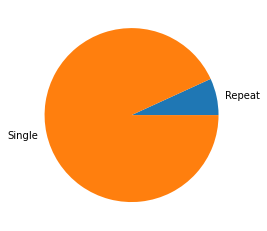

In [59]:
labels = ["Repeat","Single"]
plt.pie(np.array([len(Rep),len(Sin)]),labels=labels)
plt.show()

## Focusing on each parameter now

### 1. Sales according to the region

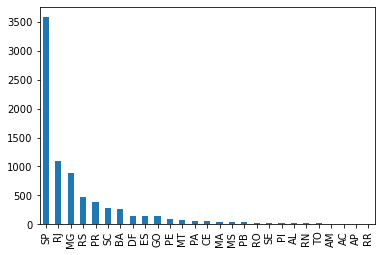

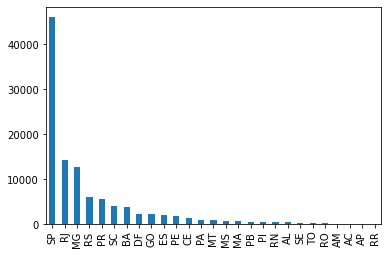

In [60]:
def region(df):
    df["customer_state"].value_counts().plot(kind="bar")
    plt.show()
region(Rep)
region(Sin)

## We could segment it manually further, based on the region, cost paid, type of payment method and so on, but we will be opting for a combination of PCA and K-Means clustering in order to segment our data.

# Performing PCA

In [61]:
from sklearn.preprocessing import LabelEncoder
lb = LabelEncoder()

In [62]:
com6 = com5.copy()

In [63]:
t = type(com["confirm_time"][0]) 

In [64]:
for i in com6.columns:
    if type(com6[i][0]) == str:
        com6[i] = lb.fit_transform(com6[i])
    if type(com6[i][0]) == t:
        com6[i] = (com6[i]/np.timedelta64(1, 'D'))*24+com6[i]/np.timedelta64(1, 'h')
com6.head()

,customer_id,customer_unique_id,customer_city,customer_state,order_id,order_status,confirm_time,time_taken,deviation_from_exp,order_item_id,product_id,seller_id,cost,product_category_name,payment_type,payment_installments
0,2592,50043,1379,25,334,2,0.553889,423.000000,506.813889,1,21694,1535,146.87,55,1,2
1,52739,59212,3360,13,74662,2,47.919444,910.653889,1007.672222,1,21694,1535,137.89,55,1,1
2,52739,59212,3360,13,74662,2,47.919444,910.653889,1007.672222,2,21694,1535,137.89,55,1,1
3,92929,22617,2528,22,68299,2,52.383333,891.421111,796.197778,1,21694,1535,140.61,55,1,7
4,41370,13205,2162,18,17746,2,53.455000,1202.777778,1013.700000,1,21694,1535,137.58,55,1,10


In [65]:
com6.isnull().sum()

customer_id                 0
customer_unique_id          0
customer_city               0
customer_state              0
order_id                    0
order_status                0
confirm_time               15
time_taken               2567
deviation_from_exp       2567
order_item_id               0
product_id                  0
seller_id                   0
cost                        0
product_category_name       0
payment_type                0
payment_installments        0
dtype: int64

In [66]:
undelivered = com6[com6["time_taken"].isnull()==True]
undelivered

,customer_id,customer_unique_id,customer_city,customer_state,order_id,order_status,confirm_time,time_taken,deviation_from_exp,order_item_id,product_id,seller_id,cost,product_category_name,payment_type,payment_installments
359,75953,48395,2500,18,41287,5,48.133889,NaN,NaN,1,19613,1,161.23,40,1,6
446,72403,20710,3588,25,70783,5,0.445556,NaN,NaN,1,19742,881,103.55,13,1,2
462,6387,2086,1232,18,26373,5,0.380556,NaN,NaN,1,19742,881,107.78,13,3,1
463,6387,2086,1232,18,26373,5,0.380556,NaN,NaN,1,19742,881,107.78,13,1,2
493,95635,94783,3766,25,5221,5,126.458333,NaN,NaN,1,19742,881,106.16,13,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
117472,74452,73299,3545,25,64324,4,0.311667,NaN,NaN,1,8942,1823,102.06,33,1,3
117500,12416,75865,705,25,15259,1,0.355000,NaN,NaN,1,8216,468,96.88,33,1,3
117520,53016,13823,738,18,12817,5,0.350000,NaN,NaN,1,31351,2623,198.57,54,1,10
117544,84316,84878,2229,18,25666,3,2.232778,NaN,NaN,1,9817,403,338.68,51,1,6


In [67]:
com7 = com6.dropna().reset_index(drop=True)
#com8 = com7.drop(["customer_id","customer_unique_id"])


In [68]:
from sklearn.preprocessing import StandardScaler as ss
s = ss()
s.fit(com7)
com8 = s.transform(com7)

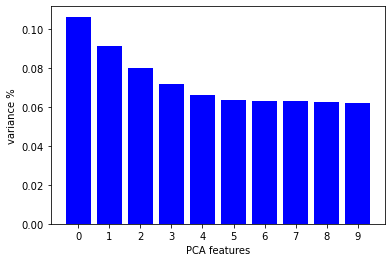

In [69]:
from sklearn.decomposition import PCA
pca = PCA(n_components=10)
principalComponents = pca.fit_transform(com8)
# Plot the explained variances
features = range(pca.n_components_)
plt.bar(features, pca.explained_variance_ratio_, color='blue')
plt.xlabel('PCA features')
plt.ylabel('variance %')
plt.xticks(features)
plt.show()
# Save components to a DataFrame
com9 = pd.DataFrame(principalComponents)

In [70]:
com9.head()

,0,1,2,3,4,5,6,7,8,9
0,-0.486455,-0.065747,0.261061,-0.442997,0.032558,-1.695214,0.756959,1.433185,-0.124127,-0.778129
1,0.130944,0.458968,-0.369805,-0.275407,-0.159039,-0.004043,0.536910,-0.828605,0.363968,0.046439
2,0.087321,0.545506,-0.553984,-0.009013,0.904012,-0.085979,0.492155,-0.851683,0.269951,0.161216
3,0.179759,-0.398386,-0.347501,1.046055,0.123371,0.351471,0.176127,-1.509389,1.135395,-0.217719
4,0.666870,-1.209642,-0.870228,1.050691,0.345508,-1.088840,0.140366,0.524909,0.955538,-0.833401


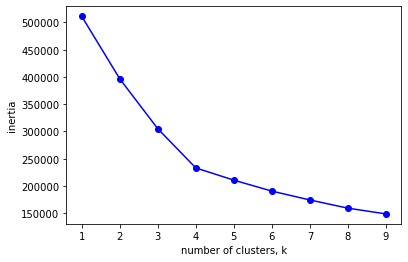

In [71]:
from sklearn.cluster import KMeans
ks = range(1, 10)
inertias = []
for k in ks:
    # Create a KMeans instance with k clusters: model
    model = KMeans(n_clusters=k)
    
    # Fit model to samples
    model.fit(com9.iloc[:,:3])
    
    # Append the inertia to the list of inertias
    inertias.append(model.inertia_)
    
plt.plot(ks, inertias, '-o', color='blue')
plt.xlabel('number of clusters, k')
plt.ylabel('inertia')
plt.xticks(ks)
plt.show()

In [72]:
model = KMeans(n_clusters=4)
y = model.fit_predict(com9.iloc[:,:3])


In [73]:
com9

,0,1,2,3,4,5,6,7,8,9
0,-0.486455,-0.065747,0.261061,-0.442997,0.032558,-1.695214,0.756959,1.433185,-0.124127,-0.778129
1,0.130944,0.458968,-0.369805,-0.275407,-0.159039,-0.004043,0.536910,-0.828605,0.363968,0.046439
2,0.087321,0.545506,-0.553984,-0.009013,0.904012,-0.085979,0.492155,-0.851683,0.269951,0.161216
3,0.179759,-0.398386,-0.347501,1.046055,0.123371,0.351471,0.176127,-1.509389,1.135395,-0.217719
4,0.666870,-1.209642,-0.870228,1.050691,0.345508,-1.088840,0.140366,0.524909,0.955538,-0.833401
...,...,...,...,...,...,...,...,...,...,...
115014,-1.504962,0.714401,0.925619,0.036042,-0.651058,-0.585587,0.509280,-2.195890,1.062859,0.310787
115015,1.457191,0.111507,-0.452877,0.908100,-0.060107,0.776384,0.760560,2.148775,-0.962562,-1.045330
115016,-1.351112,0.203529,0.972506,0.487092,-0.772125,-0.653311,0.609234,0.039534,1.401409,-1.400121
115017,3.352441,-1.377176,0.188225,-0.798189,0.235849,-0.113674,0.524066,1.291530,0.016258,-1.004060


In [74]:
labels = model.predict(com9.iloc[:,:3])

In [75]:
com9["label"] = y

In [76]:
com9

,0,1,2,3,4,5,6,7,8,9,label
0,-0.486455,-0.065747,0.261061,-0.442997,0.032558,-1.695214,0.756959,1.433185,-0.124127,-0.778129,1
1,0.130944,0.458968,-0.369805,-0.275407,-0.159039,-0.004043,0.536910,-0.828605,0.363968,0.046439,3
2,0.087321,0.545506,-0.553984,-0.009013,0.904012,-0.085979,0.492155,-0.851683,0.269951,0.161216,3
3,0.179759,-0.398386,-0.347501,1.046055,0.123371,0.351471,0.176127,-1.509389,1.135395,-0.217719,0
4,0.666870,-1.209642,-0.870228,1.050691,0.345508,-1.088840,0.140366,0.524909,0.955538,-0.833401,0
...,...,...,...,...,...,...,...,...,...,...,...
115014,-1.504962,0.714401,0.925619,0.036042,-0.651058,-0.585587,0.509280,-2.195890,1.062859,0.310787,1
115015,1.457191,0.111507,-0.452877,0.908100,-0.060107,0.776384,0.760560,2.148775,-0.962562,-1.045330,0
115016,-1.351112,0.203529,0.972506,0.487092,-0.772125,-0.653311,0.609234,0.039534,1.401409,-1.400121,1
115017,3.352441,-1.377176,0.188225,-0.798189,0.235849,-0.113674,0.524066,1.291530,0.016258,-1.004060,2


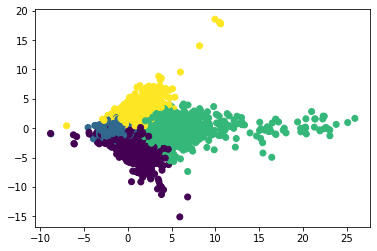

In [77]:
plt.scatter(com9[0],com9[1],c=com9["label"])
plt.show()

In [78]:
com7["Cluster"] = y

In [79]:
com9["label"]=y

In [80]:
com6

,customer_id,customer_unique_id,customer_city,customer_state,order_id,order_status,confirm_time,time_taken,deviation_from_exp,order_item_id,product_id,seller_id,cost,product_category_name,payment_type,payment_installments
0,2592,50043,1379,25,334,2,0.553889,423.000000,506.813889,1,21694,1535,146.87,55,1,2
1,52739,59212,3360,13,74662,2,47.919444,910.653889,1007.672222,1,21694,1535,137.89,55,1,1
2,52739,59212,3360,13,74662,2,47.919444,910.653889,1007.672222,2,21694,1535,137.89,55,1,1
3,92929,22617,2528,22,68299,2,52.383333,891.421111,796.197778,1,21694,1535,140.61,55,1,7
4,41370,13205,2162,18,17746,2,53.455000,1202.777778,1013.700000,1,21694,1535,137.58,55,1,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
117596,84339,35612,3588,25,77142,2,0.644444,132.067222,637.789444,1,22372,2957,30.95,63,1,1
117597,9382,73988,3580,13,26864,2,95.825556,1380.128889,780.012222,1,24169,53,304.11,11,1,4
117598,50095,1624,3588,25,28294,2,0.593889,107.382778,528.921667,1,31768,2457,92.36,33,1,3
117599,11900,48887,521,10,31545,2,0.375556,1695.113333,-375.251667,1,25961,981,199.92,30,1,5


# Delivered vs Undelivered

In [94]:
def time_change(com6):
    for i in com6.columns:
    #if type(com6[i][0]) == str:
        #com6[i] = lb.fit_transform(com6[i])
        if type(com6.loc[0][i]) == t:
            com6[i] = (com6[i]/np.timedelta64(1, 'D'))*24+com6[i]/np.timedelta64(1, 'h')
    return com6

In [89]:
Rep.iloc[1][0]

'ab156e9202420e577b405360a7b29cbc'

In [95]:
Rep1 = time_change(Rep)
Sin1 = time_change(Sin)

In [96]:
Rep1

,customer_id,customer_unique_id,customer_city,customer_state,order_id,order_status,confirm_time,time_taken,deviation_from_exp,order_item_id,product_id,seller_id,cost,product_category_name,payment_type,payment_installments
0,ab156e9202420e577b405360a7b29cbc,b52b8debdefe66d4c0d7f44d9b4ff088,armacao dos buzios,RJ,54d6f9d8f56229d3da815add65ec2408,delivered,0.578889,2893.808333,-1043.748889,1,a9516a079e37a9c9c36b9b78b10169e8,7c67e1448b00f6e969d365cea6b010ab,174.07,moveis_escritorio,credit_card,2
1,ab156e9202420e577b405360a7b29cbc,b52b8debdefe66d4c0d7f44d9b4ff088,armacao dos buzios,RJ,54d6f9d8f56229d3da815add65ec2408,delivered,0.578889,2893.808333,-1043.748889,2,a9516a079e37a9c9c36b9b78b10169e8,7c67e1448b00f6e969d365cea6b010ab,174.07,moveis_escritorio,credit_card,2
2,6747dabc507b18f4a1300777643744d7,21a2d9dc71459dbd3dad219cb9681964,uberlandia,MG,a8f412e6559ed350a64d8b9f2ecbcc84,delivered,47.955556,676.671667,433.000556,1,4aa6014eceb682077f9dc4bffebc05b0,b8bc237ba3788b23da09c0f1f3a3288c,351.96,utilidades_domesticas,credit_card,8
3,8f9cdc2bab0d953cab1e98d25253d8fe,339c527109c4c03e8e09bd4b593dab5f,urania,SP,710d9b541d2ae52ef56ef33f5e1b795c,delivered,0.372222,449.427778,867.064444,1,4aa6014eceb682077f9dc4bffebc05b0,b8bc237ba3788b23da09c0f1f3a3288c,308.27,utilidades_domesticas,credit_card,8
4,681afb2f3720c1aa3d3fee254be18800,07f765655f560c8624267665ce23675a,vera cruz,RS,1feca64d75daa682ce3174a1eff73d8b,delivered,0.256667,439.565556,971.509444,1,4aa6014eceb682077f9dc4bffebc05b0,b8bc237ba3788b23da09c0f1f3a3288c,318.61,utilidades_domesticas,credit_card,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8027,0e240f6e253b7d7646700ce3b28fe413,6d443b75cff956bb73dce7385033e266,jundiai,SP,a1fa82769a203e30b8faf81cd32e5193,delivered,68.472778,404.807778,920.216111,2,24aba57735be13fd785bc04d1a8812e4,b335c59ab742f751a85db9c411a86739,205.05,NaN,voucher,1
8028,adad0151d1c1f4c056b59dd6f9146d58,95fc0e6f6939f521e44a588ff18eacb9,nazare paulista,SP,db738d19eb9fe6721be783d4e46f1c4d,delivered,19.755000,644.330000,779.450000,1,dfd2ea8377fb2838a47488c5b37558f1,93b9a99027bd8bd6af682aff18dd19bf,259.57,moveis_decoracao,boleto,1
8029,ebf46ff530343a129926adc1f831dea4,0ee57f62666561b72f2ceacad0230cbf,sao caetano do sul,SP,181ff95f97fee531c4afa9e882186f18,delivered,0.745000,334.081667,981.373889,1,585e7f7e97e55cb9e74556236b43b0be,dfa0c4c6229ab200a4a1336b4d7128ff,42.19,utilidades_domesticas,credit_card,1
8030,ebf46ff530343a129926adc1f831dea4,0ee57f62666561b72f2ceacad0230cbf,sao caetano do sul,SP,181ff95f97fee531c4afa9e882186f18,delivered,0.745000,334.081667,981.373889,2,585e7f7e97e55cb9e74556236b43b0be,dfa0c4c6229ab200a4a1336b4d7128ff,42.19,utilidades_domesticas,credit_card,1
